==========================================================================================================

# **Weather Classification Using Computer Vision**

==========================================================================================================

# **i. Perkenalan**

* Nama  : Fadhil Athallah
* Batch : HCK-015

Program ini dibuat untuk melakukan pengelompokkan gambar berdasarkan cuaca yang terlihat pada gambar. Data yang digunakan merupakan data informasi cuaca mulai dari berkabut, berawan, hujan, cerah, dan matahari terbit. Data diambil dari website kaggle dengan link sebagai berikut

* Link kaggle : https://www.kaggle.com/datasets/vijaygiitk/multiclass-weather-dataset/data

* Link huggingface : https://huggingface.co/spaces/FadhilAthallah/GC7_Fadhil_Athallah

# **ii. Import Libraries**

In [1]:
# Import Libraries

import glob
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import tensorflow as tf
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.models import Sequential
from tensorflow.keras import layers
from tensorflow.keras.layers import Dropout
from tensorflow.keras.layers import Input, Rescaling, Conv2D, MaxPooling2D, GlobalAveragePooling2D, Dropout, Dense, BatchNormalization, LeakyReLU
from tensorflow.keras.models import Model
from tensorflow.keras.callbacks import EarlyStopping, LearningRateScheduler


from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report


# Save model
import pickle
import joblib
import json


# **iii. Data Loading**
Proses memasukkan data image ke dalam program menggunakan directory

In [2]:
# Listing images of each category

foggy_files = glob.glob('C:/Users/Fadhil/Downloads/Gambar/dataset/data/foggy/*')
rainy_files = glob.glob('C:/Users/Fadhil/Downloads/Gambar/dataset/data/rainy/*')
cloudy_files = glob.glob('C:/Users/Fadhil/Downloads/Gambar/dataset/data/cloudy/*')
shine_files = glob.glob('C:/Users/Fadhil/Downloads/Gambar/dataset/data/shine/*')
sunrise_files = glob.glob('C:/Users/Fadhil/Downloads/Gambar/dataset/data/sunrise/*')


foggy_files.sort()
rainy_files.sort()
cloudy_files.sort()
shine_files.sort()
sunrise_files.sort()

* 5 jenis data berupa cuaca berawan, hujan, berawan, cerah, dan matahari terbit masing-masing telah diambil dari directory dan dijadikan sebuah variabel 

In [3]:
# Create a Pandas DataFrame that contains the path of all images

all_files = foggy_files + rainy_files + cloudy_files + shine_files + sunrise_files
labels = ['foggy' for i in range(len(foggy_files))] + ['rainy' for i in range(len(rainy_files))] + ['cloudy' for i in range(len(cloudy_files))] + ['shine' for i in range(len(shine_files))] + ['sunrise' for i in range(len(sunrise_files))]
img_df = pd.DataFrame({'images':all_files, 'label':labels})
img_df = img_df.sample(len(img_df)).reset_index(drop=True)
img_df

,images,label
0,C:/Users/Fadhil/Downloads/Gambar/dataset/data/...,shine
1,C:/Users/Fadhil/Downloads/Gambar/dataset/data/...,rainy
2,C:/Users/Fadhil/Downloads/Gambar/dataset/data/...,shine
3,C:/Users/Fadhil/Downloads/Gambar/dataset/data/...,sunrise
4,C:/Users/Fadhil/Downloads/Gambar/dataset/data/...,sunrise
...,...,...
1495,C:/Users/Fadhil/Downloads/Gambar/dataset/data/...,foggy
1496,C:/Users/Fadhil/Downloads/Gambar/dataset/data/...,foggy
1497,C:/Users/Fadhil/Downloads/Gambar/dataset/data/...,shine
1498,C:/Users/Fadhil/Downloads/Gambar/dataset/data/...,cloudy


* variabel tiap jenis gambar digabungkan menjadi satu dataframe, dimana tiap data diberikan label berdasarkan jenisnya. Dataframe ini nantinya akan digunakan untuk melihat jumlah distribusi dari tiap data yang ada

In [4]:
# Takes the path to a directory & generates batches of augmented data from a directory

IMG_SIZE = 400
path = 'C:/Users/Fadhil/Downloads/Gambar/dataset/data'

datagen = tf.keras.preprocessing.image.ImageDataGenerator()
data = datagen.flow_from_directory(path, (IMG_SIZE, IMG_SIZE), batch_size=32, class_mode='categorical', shuffle=False) # `class_mode=categorical` for multiclass

Found 1500 images belonging to 5 classes.


* Proses pengambilan gambar berdasarkan directory dimana berhasil dimasukkan 1500 gambar yang didalamnya terdapat 5 kelas 

In [5]:
# Show images in pixel form

print('Images : ', data[0][0])
print('Shape  : ', data[0][0].shape)

Images :  [[[[125. 125. 125.]
   [128. 128. 128.]
   [131. 131. 131.]
   ...
   [152. 152. 152.]
   [149. 149. 149.]
   [145. 145. 145.]]

  [[125. 125. 125.]
   [129. 129. 129.]
   [131. 131. 131.]
   ...
   [149. 149. 149.]
   [146. 146. 146.]
   [142. 142. 142.]]

  [[126. 126. 126.]
   [129. 129. 129.]
   [131. 131. 131.]
   ...
   [144. 144. 144.]
   [141. 141. 141.]
   [138. 138. 138.]]

  ...

  [[ 23.  23.  23.]
   [ 23.  23.  23.]
   [ 23.  23.  23.]
   ...
   [ 55.  55.  55.]
   [ 55.  55.  55.]
   [ 56.  56.  56.]]

  [[ 23.  23.  23.]
   [ 23.  23.  23.]
   [ 23.  23.  23.]
   ...
   [ 54.  54.  54.]
   [ 54.  54.  54.]
   [ 55.  55.  55.]]

  [[ 22.  22.  22.]
   [ 22.  22.  22.]
   [ 22.  22.  22.]
   ...
   [ 53.  53.  53.]
   [ 54.  54.  54.]
   [ 55.  55.  55.]]]


 [[[177. 192. 223.]
   [171. 186. 217.]
   [171. 186. 217.]
   ...
   [142. 169. 199.]
   [142. 169. 199.]
   [144. 171. 201.]]

  [[177. 192. 223.]
   [171. 186. 217.]
   [171. 186. 217.]
   ...
   [142. 16

* Dapat dilihat bahwa gambar sudah tersambung dan disimpan menjadi bentuk angka berdasarkan pixel pada gambar tersebut

# **iv. Exploratory Data Analysis (EDA)**
Proses eksplorasi dataset yang digunakan sebagai data latihan oleh model


## **Pengecekan Distribusi Data** 

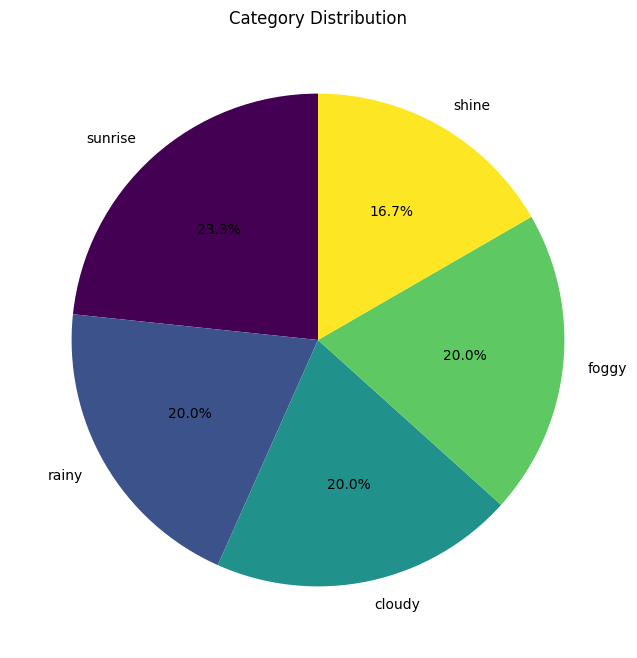

In [6]:
category_counts = img_df['label'].value_counts()

# Plotting the pie chart
plt.figure(figsize=(8, 8))
category_counts.plot.pie(autopct='%1.1f%%', startangle=90, cmap='viridis')
plt.ylabel('')  # Hide the y-label
plt.title('Category Distribution')
plt.show()

* Persebaran data memiliki distribusi yang merata untuk gambar cloudy, rainy dan foggy dengan jumlah 20% dari total kesuluruhan data 
* sunrise memiliki jumlah 23.3% dan shine memiliki jumlah 16.7% dari keseluruhan data total
* Berdasarkan dari seluruh persebarannyannya, data yang akan digunakan ini memiliki perseberaran yang sudah cukup baik dengan perbedaan jumlah yang tidak terlalu jauh


## **Pengecekan isi gambar dari tiap jenis kelas**

### **Berkabut**

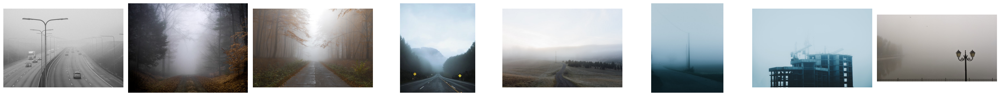

In [7]:
num_images = min(len(foggy_files), 8)

fig, ax = plt.subplots(ncols=num_images, figsize=(30, 3))
for i in range(num_images):
    foggy = plt.imread(foggy_files[i])
    ax[i].imshow(foggy)
    ax[i].axis('off')  # Optionally turn off axis for better visualization

plt.tight_layout()
plt.show()

### **Hujan**

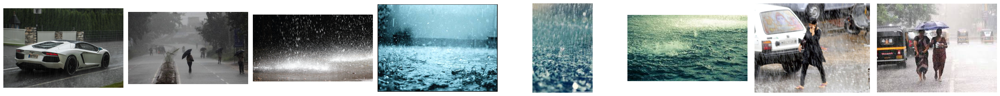

In [8]:
num_images = min(len(rainy_files), 8)

fig, ax = plt.subplots(ncols=num_images, figsize=(30, 3))
for i in range(num_images):
    rainy = plt.imread(rainy_files[i])
    ax[i].imshow(rainy)
    ax[i].axis('off')  # Optionally turn off axis for better visualization

plt.tight_layout()
plt.show()

### **Berawan**

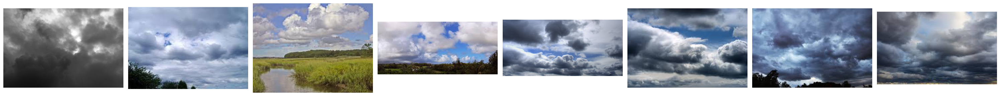

In [9]:
num_images = min(len(cloudy_files), 8)

fig, ax = plt.subplots(ncols=num_images, figsize=(30, 3))
for i in range(num_images):
    cloudy = plt.imread(cloudy_files[i])
    ax[i].imshow(cloudy)
    ax[i].axis('off')  # Optionally turn off axis for better visualization

plt.tight_layout()
plt.show()

### **Cerah**

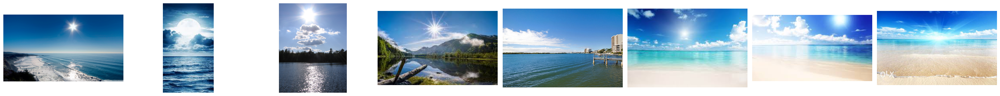

In [10]:
num_images = min(len(shine_files), 8)

fig, ax = plt.subplots(ncols=num_images, figsize=(30, 3))
for i in range(num_images):
    shine = plt.imread(shine_files[i])
    ax[i].imshow(shine)
    ax[i].axis('off')  # Optionally turn off axis for better visualization

plt.tight_layout()
plt.show()

### **Matahari Terbit**

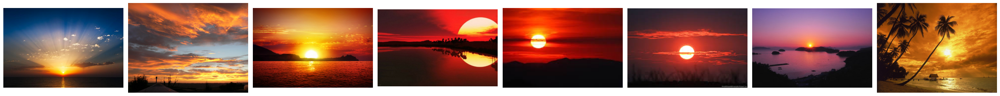

In [11]:
num_images = min(len(sunrise_files), 8)

fig, ax = plt.subplots(ncols=num_images, figsize=(30, 3))
for i in range(num_images):
    sunrise = plt.imread(sunrise_files[i])
    ax[i].imshow(sunrise)
    ax[i].axis('off')  # Optionally turn off axis for better visualization

plt.tight_layout()
plt.show()

* berdasarkan pengecekan, kelima kelas sudah berhasil memasukkan gambar yang sesuai 

# **vi. Feature Engineering** 


## **Splitting**
Pemisahan data menjadi data training, evaluation, dan testing 

In [12]:
imgen = tf.keras.preprocessing.image.ImageDataGenerator(validation_split=0.2)

# Create a generator for the training set
train = imgen.flow_from_directory(
    path,
    target_size=(400, 400),
    class_mode='categorical',
    subset='training',  # Use the training subset
    shuffle=True,
    seed=1
)

# Create a generator for the validation set
val = imgen.flow_from_directory(
    path,
    target_size=(400, 400),
    class_mode='categorical',
    subset='validation',  # Use the validation subset
    shuffle=True,
    seed=1
)

test = ImageDataGenerator().flow_from_directory(
    "C:/Users/Fadhil/Downloads/Gambar/dataset/alien_test",
	target_size=(400,400),
	class_mode='categorical',
    batch_size=32,
	shuffle=True,
    seed=1
)



Found 1200 images belonging to 5 classes.
Found 300 images belonging to 5 classes.
Found 30 images belonging to 5 classes.


* Dari hasil splitting, 80% data akan digunakan sebagai data train dan 20% akan digunakan menjadi data val. Data test sendiri diambil dari folder gambar tersendiri yang memiliki isi gambar diluar dari data train dan val.
* Berdasarkan hasil splitting didapatkan 1200 dengan jumlah 5 kelas untuk train, 300 gambar dengan jumlah 5 kelas untuk val, dan 30 gambar dengan jumlah 5 kelas untuk test


Untuk memastikan isi tiap data, dilakukan pengecekan gambar train dan val dibawah ini

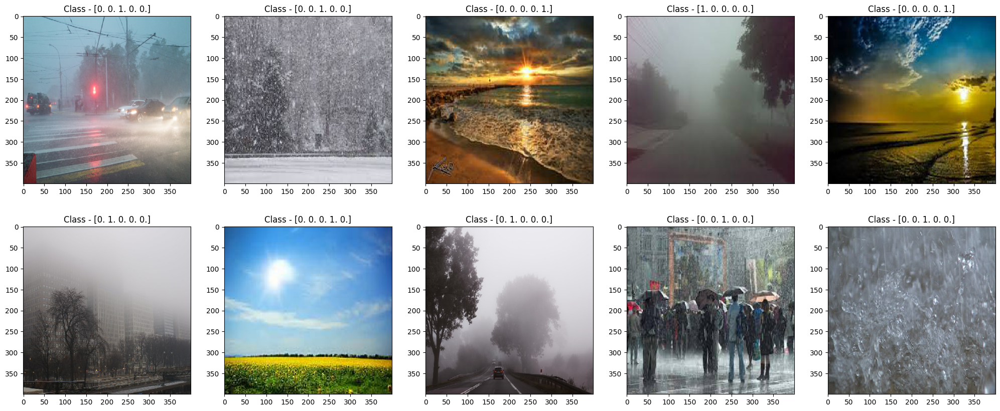

In [13]:
# Show images of train-set

fig, ax = plt.subplots(nrows=2, ncols=5, figsize=(25,10))
n = 0

for i in range(2):
  for j in range(5):
    img = train[0][0][n].astype('uint8')
    ax[i][j].imshow(img)
    ax[i][j].set_title('Class - ' + str(train[0][1][n]))
    n += 1

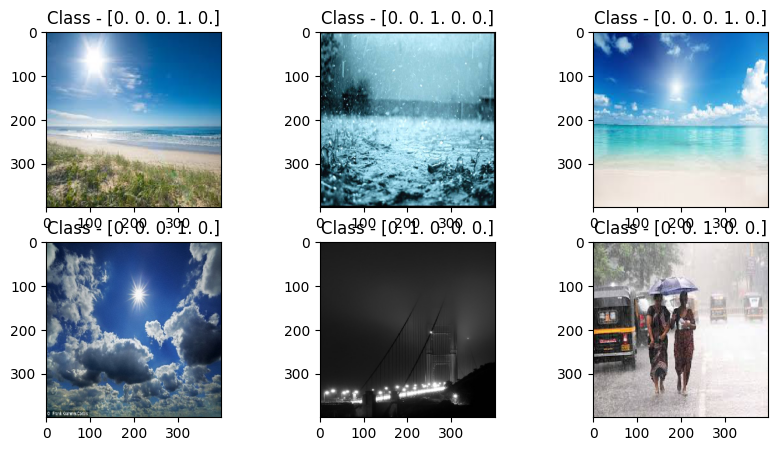

In [14]:
# Show images of val-set

fig, ax = plt.subplots(nrows=2, ncols=3, figsize=(10,5))
n = 0

for i in range(2):
  for j in range(3):
    img = val[0][0][n].astype('uint8')
    ax[i][j].imshow(img)
    ax[i][j].set_title('Class - ' + str(val[0][1][n]))
    n += 1

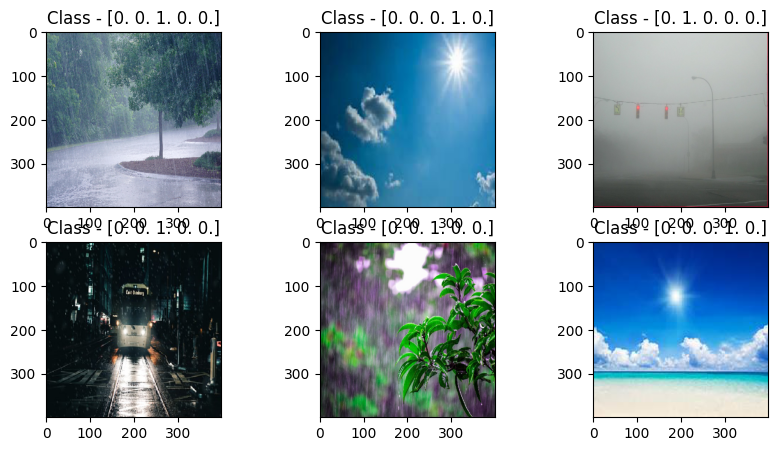

In [15]:
# Show images of val-set

fig, ax = plt.subplots(nrows=2, ncols=3, figsize=(10,5))
n = 0

for i in range(2):
  for j in range(3):
    img = test[0][0][n].astype('uint8')
    ax[i][j].imshow(img)
    ax[i][j].set_title('Class - ' + str(test[0][1][n]))
    n += 1

## **Data Augmentation** 
Proses augmentasi gambar dengan cara diputar, zoom, menggeser, dan memburamkan gambar. Proses ini dilakukan agar model dapat mempelajari gambar dengan lebih detail. Proses ini hanya akan dilakukan ke data train dikarenakan untuk val, data yang diuji harus berbentuk seperti data input normal yang akan dimasukkan kedalam model oleh pengguna. Berikut penjelesan dari proses yang akan dilakukan : 
* `width_shift_range`: Menggeser gambar secara acak secara horizontal dalam rentang [-100, 100] pixel, membuat model menjadi tahan terhadap perubahan posisi horizontal.
* `height_shift_range`: Menggeser gambar secara acak secara vertikal dalam rentang [-100, 100] pixel, membuat model menjadi tahan terhadap perubahan posisi vertikal.
* `rotation_range`: Memutar gambar secara acak hingga 120 derajat searah jarum jam atau berlawanan arah jarum jam, membantu model menangani berbagai orientasi objek.
* `zoom_range`: Memperbesar atau memperkecil gambar secara acak dalam rentang [0.3, 1.5] kali, membantu model menjadi tahan terhadap berbagai ukuran objek.
* `shear_range`: Mengeser gambar secara acak hingga 50 derajat, membuat model menjadi kuat terhadap transformasi shearing.
* `validation_split`: Membagi data menjadi 80% untuk pelatihan dan 20% untuk validasi untuk mengevaluasi kinerja model pada data yang belum pernah dilihat. 

Found 1200 images belonging to 5 classes.


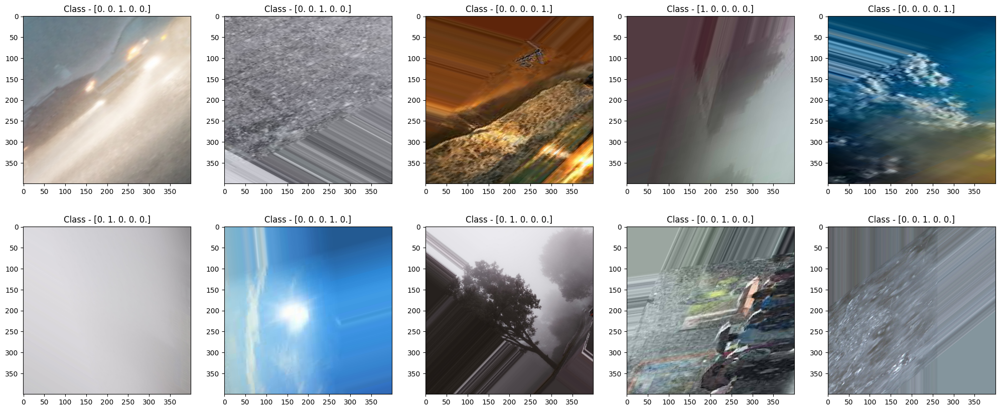

In [16]:
# Data Augmentation - Combine all previous data augmentations
imgen3 = tf.keras.preprocessing.image.ImageDataGenerator(width_shift_range=[-100, 100],
                                                         height_shift_range=[-100, 100],
                                                         rotation_range=120,
                                                         zoom_range = [0.3, 1.5],
                                                         shear_range=50,
                                                         validation_split=0.2)
train3 = imgen3.flow_from_directory(path,
                                    target_size=(400,400),
                                    class_mode='categorical',
                                    subset='training',
                                    shuffle=True,
                                    seed=1)

# Show images of train-set
fig, ax = plt.subplots(nrows=2, ncols=5, figsize=(25,10))
n = 0

for i in range(2):
  for j in range(5):
    img = train3[0][0][n].astype('uint8')
    ax[i][j].imshow(img)
    ax[i][j].set_title('Class - ' + str(train[0][1][n]))
    n += 1

* Berdasarkan gambar yang ditampilkan, isi dari tiap gambar telah diaumentasi dan siap dipelajari oleh model

# **v. Modelling**
Proses modeling menggunakan metode sequential dan functional untuk dibandingkan yang mana yang terbaik untuk digunakan. Kedua model ini akan menggunakan proses layering yang sama akan tetapi hanya memiliki perbedaan fungsi dimana yang satu adalah sequential dan satu fungsional

## **Sequential API**
Model Sequential adalah suatu jenis model neuron yang memungkinkan pembangunan secara berurutan dari input hingga output, cocok untuk arsitektur model yang sederhana dan juga linier. Berikut adalah penjelasan dari tiap layer dan juga parameter yang akan digunakan :
* `Conv2D Layer`: Lapisan konvolusional dengan 32 filter ukuran 3x3, diikuti dengan lapisan pooling 2x2. Lapisan ini mengekstraksi fitur dari gambar masukan.
* `MaxPooling2D Layer`: Lapisan pooling yang mengurangi dimensi data, membantu mengurangi komputasi dan overfitting.
* `Flatten Layer`: Mengubah data dari 2D menjadi 1D untuk dapat diteruskan ke lapisan dense.
* `Dense Layer`: Lapisan dense dengan 512 unit dan aktivasi ReLU untuk melakukan klasifikasi.
* `Dropout Layer`: Lapisan dropout dengan rasio 0.5 untuk regularisasi, mengurangi overfitting.
* `Output Layer`: Lapisan dense dengan 5 unit dan aktivasi softmax untuk klasifikasi multi-kelas.
* `Aktivation = Relu`, jenis aktivasi ini digunakan untuk mengubah seluruh nilai negatif menjadi nol, fungsi aktivasi ini dipilih karena sederhana, efisien, dan efektif dalam melawan masalah gradien hilang, mempercepat pembelajaran model, serta memungkinkan pembelajaran representasi fitur yang lebih kompleks dalam jaringan saraf. 


In [69]:
# Clear the Keras session
tf.keras.backend.clear_session()

model = tf.keras.models.Sequential()

# Define the input layer with the desired shape
model.add(tf.keras.layers.Input(shape=(400, 400, 3)))

# Add the Rescaling layer without input_shape argument
model.add(tf.keras.layers.Rescaling(1./255))

# Add the rest of the layers
model.add(tf.keras.layers.Conv2D(32, (3, 3), activation='relu'))
model.add(tf.keras.layers.MaxPooling2D(2, 2))
model.add(tf.keras.layers.Conv2D(64, (3, 3), activation='relu'))
model.add(tf.keras.layers.MaxPooling2D(2, 2))
model.add(tf.keras.layers.Conv2D(128, (3, 3), activation='relu'))
model.add(tf.keras.layers.MaxPooling2D(2, 2))
model.add(tf.keras.layers.GlobalAveragePooling2D())
model.add(tf.keras.layers.Dropout(0.5))
model.add(tf.keras.layers.Dense(512, activation='relu'))
model.add(tf.keras.layers.Dense(5, activation='softmax'))

# Print the model summary
model.summary()

Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ rescaling (Rescaling)           │ (None, 400, 400, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d (Conv2D)                 │ (None, 398, 398, 32)   │           896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d (MaxPooling2D)    │ (None, 199, 199, 32)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_1 (Conv2D)               │ (None, 197, 197, 64)   │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_1 (MaxPooling2D)  │ (None, 98, 98, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_2 (Conv2D)               │ (None, 96, 96, 128)    │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_2 (MaxPooling2D)  │ (None, 48, 48, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d        │ (None, 128)            │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 512)            │        66,048 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 5)              │         2,565 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 161,861 (632.27 KB)

 Trainable params: 161,861 (632.27 KB)

 Non-trainable params: 0 (0.00 B)

* Pembuatan model berhasil dilakukan 

Untuk evaluasi model, berikut adalah parameter yang digunakan :
* `loss=categorical_crossentropy`: Fungsi kerugian yang digunakan untuk menghitung kesalahan antara prediksi model dan label yang sebenarnya. categorical_crossentropy biasanya digunakan untuk masalah klasifikasi multi-kelas dengan output yang dienkoding dalam format one-hot.
* `optimizer='Adam'`: Algoritma optimasi yang digunakan untuk menyesuaikan bobot model berdasarkan gradien fungsi kerugian. Adam adalah salah satu optimizer yang paling umum digunakan karena efisien dan efektif.
* `metrics=['accuracy']`: Metrik yang digunakan untuk memantau kinerja model selama pelatihan. Dalam hal ini, metrik yang dipilih adalah akurasi, yang mengukur seberapa sering model memberikan prediksi yang benar.

In [70]:
model.compile(loss = 'categorical_crossentropy', optimizer='Adam', metrics=['accuracy'])

history = model.fit(train3, epochs=10, validation_data = val)

Epoch 1/10


c:\Users\Fadhil\miniconda3\lib\site-packages\keras\src\trainers\data_adapters\py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


38/38 ━━━━━━━━━━━━━━━━━━━━ 116s 3s/step - accuracy: 0.2942 - loss: 1.5392 - val_accuracy: 0.4833 - val_loss: 1.2075
Epoch 2/10
38/38 ━━━━━━━━━━━━━━━━━━━━ 102s 2s/step - accuracy: 0.4324 - loss: 1.2843 - val_accuracy: 0.5033 - val_loss: 1.1358
Epoch 3/10
38/38 ━━━━━━━━━━━━━━━━━━━━ 99s 2s/step - accuracy: 0.4790 - loss: 1.1404 - val_accuracy: 0.6133 - val_loss: 1.0282
Epoch 4/10
38/38 ━━━━━━━━━━━━━━━━━━━━ 99s 2s/step - accuracy: 0.5366 - loss: 1.0906 - val_accuracy: 0.6267 - val_loss: 0.9818
Epoch 5/10
38/38 ━━━━━━━━━━━━━━━━━━━━ 100s 2s/step - accuracy: 0.5620 - loss: 0.9903 - val_accuracy: 0.6067 - val_loss: 0.9370
Epoch 6/10
38/38 ━━━━━━━━━━━━━━━━━━━━ 100s 2s/step - accuracy: 0.5812 - loss: 0.9706 - val_accuracy: 0.5833 - val_loss: 0.9909
Epoch 7/10
38/38 ━━━━━━━━━━━━━━━━━━━━ 98s 2s/step - accuracy: 0.5592 - loss: 0.9902 - val_accuracy: 0.6533 - val_loss: 0.9287
Epoch 8/10
38/38 ━━━━━━━━━━━━━━━━━━━━ 98s 2s/step - accuracy: 0.5674 - loss: 0.9598 - val_accuracy: 0.6167 - val_loss: 0.9418

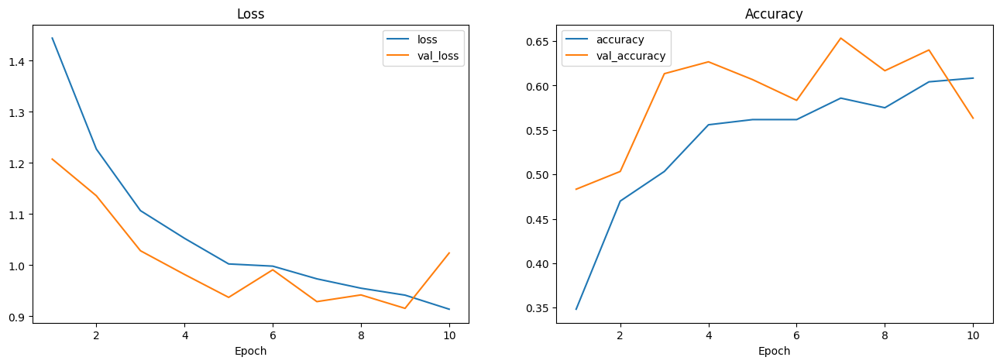

In [71]:
epoch=10

fig, ax = plt.subplots(ncols=2,figsize=(16,5))
ax[0].plot(range(1,epoch+1),history.history['loss'],label='loss')
ax[0].plot(range(1,epoch+1),history.history['val_loss'],label='val_loss')
ax[0].set_title('Loss')
ax[0].legend()
ax[0].set_xlabel('Epoch')
#ax[0].set_ylim(0,0.01)

ax[1].plot(range(1,epoch+1),history.history['accuracy'],label='accuracy')
ax[1].plot(range(1,epoch+1),history.history['val_accuracy'],label='val_accuracy')
ax[1].set_title('Accuracy')
ax[1].legend()
ax[1].set_xlabel('Epoch')
#ax[1].set_ylim(0.5,1.5)

plt.show()

In [72]:
train_loss, train_accuracy = model.evaluate(train3)
val_loss, val_accuracy = model.evaluate(val)

print('Training Loss:', train_loss)
print('Training Accuracy:', train_accuracy)

print('Validation Loss:', val_loss)
print('Validation Accuracy:', val_accuracy)

38/38 ━━━━━━━━━━━━━━━━━━━━ 59s 2s/step - accuracy: 0.6105 - loss: 0.9072
10/10 ━━━━━━━━━━━━━━━━━━━━ 6s 590ms/step - accuracy: 0.5501 - loss: 1.0403
Training Loss: 0.8974167108535767
Training Accuracy: 0.6191666722297668
Validation Loss: 1.0238299369812012
Validation Accuracy: 0.5633333325386047


* **Train** 
    * Berdasarkan Hasil eval train, data train memiliki akurasi benar 61.9% dengan loss sebesar 0.89. Nilai ini menunjukkan kemampuan prediksi model yang masih kurang baik namun tetap memiliki kemungkinan memprediksi gambar dengan akurat yang lumayan baik jika dibandingkan dengan presentase kesalahannya 
* **Val**
    * Berdasarkan Hasil eval data valuation, data val memiliki akurasi benar 0.56% dengan loss sebesar 0.89. Nilai ini menunjukkan kemampuan prediksi model yang masih kurang baik namun tetap memiliki kemungkinan memprediksi gambar dengan akurat yang lumayan baik jika dibandingkan dengan presentase kesalahannya 
* **Kesimplan**
    * Model berupa model overfit, namun overfit ini tidak terlalu besar. 

## **Functional API**
Fynctional API adalah Cara fleksibel membangun model neural network dengan arsitektur kompleks, termasuk multiple input/output, shared layers, dan branching models. Berikut adalah penjelasan dari tiap layer dan parameter yang digunakan : 
* `Clear the Keras session`: Membersihkan sesi Keras sebelum memulai, memastikan tidak ada model atau lapisan yang tersisa dari sesi sebelumnya
* `Define the input layer`: Mendefinisikan lapisan input dengan bentuk (shape) data masukan yang diharapkan.
* `Add the Rescaling layer`: Menambahkan lapisan Rescaling untuk mengubah rentang nilai piksel gambar menjadi rentang [0,1].
* `Add Conv2D and MaxPooling2D layers`: Menambahkan tiga lapisan Conv2D dan MaxPooling2D berturut-turut untuk mengekstraksi fitur dari gambar. Setiap lapisan Conv2D menggunakan fungsi aktivasi ReLU.
* `Add the GlobalAveragePooling2D layer`: Menambahkan lapisan GlobalAveragePooling2D untuk mengubah matriks fitur 3D menjadi vektor fitur 1D.
* `Add the Dropout layer`: Menambahkan lapisan Dropout untuk mencegah overfitting dengan secara acak menonaktifkan sebagian unit (neuron) selama pelatihan.
* `Add the first Dense layer`: Menambahkan lapisan Dense pertama dengan 512 unit dan aktivasi ReLU.
* `Add the output Dense layer`: Menambahkan lapisan Dense output dengan 5 unit (jumlah kelas yang diinginkan) dan aktivasi softmax untuk output kelas probabilistik.
* `Create the model`: Membuat model dengan menggunakan Model class, dengan menentukan lapisan input dan output.
* `Aktivation = Relu`, jenis aktivasi ini digunakan untuk mengubah seluruh nilai negatif menjadi nol, fungsi aktivasi ini dipilih karena sederhana, efisien, dan efektif dalam melawan masalah gradien hilang, mempercepat pembelajaran model, serta memungkinkan pembelajaran representasi fitur yang lebih kompleks dalam jaringan saraf. 

In [17]:
# Clear the Keras session
tf.keras.backend.clear_session()

# Define the input layer
input_layer = tf.keras.layers.Input(shape=(400, 400, 3))

# Add the Rescaling layer
rescaled_input = tf.keras.layers.Rescaling(1./255)(input_layer)

# Add the first Conv2D and MaxPooling2D layers
conv1 = tf.keras.layers.Conv2D(32, (3, 3), activation='relu')(rescaled_input)
pool1 = tf.keras.layers.MaxPooling2D(2, 2)(conv1)

# Add the second Conv2D and MaxPooling2D layers
conv2 = tf.keras.layers.Conv2D(64, (3, 3), activation='relu')(pool1)
pool2 = tf.keras.layers.MaxPooling2D(2, 2)(conv2)

# Add the third Conv2D and MaxPooling2D layers
conv3 = tf.keras.layers.Conv2D(128, (3, 3), activation='relu')(pool2)
pool3 = tf.keras.layers.MaxPooling2D(2, 2)(conv3)

# Add the GlobalAveragePooling2D layer
global_avg_pool = tf.keras.layers.GlobalAveragePooling2D()(pool3)

# Add the Dropout layer
dropout = tf.keras.layers.Dropout(0.5)(global_avg_pool)

# Add the first Dense layer
dense1 = tf.keras.layers.Dense(512, activation='relu')(dropout)

# Add the output Dense layer
output_layer = tf.keras.layers.Dense(5, activation='softmax')(dense1)

# Create the model
model_func = tf.keras.models.Model(inputs=input_layer, outputs=output_layer)

# Print the model summary
model_func.summary()

Model: "functional_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)        │ (None, 400, 400, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ rescaling (Rescaling)           │ (None, 400, 400, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d (Conv2D)                 │ (None, 398, 398, 32)   │           896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d (MaxPooling2D)    │ (None, 199, 199, 32)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_1 (Conv2D)               │ (None, 197, 197, 64)   │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_1 (MaxPooling2D)  │ (None, 98, 98, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_2 (Conv2D)               │ (None, 96, 96, 128)    │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_2 (MaxPooling2D)  │ (None, 48, 48, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d        │ (None, 128)            │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 512)            │        66,048 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 5)              │         2,565 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 161,861 (632.27 KB)

 Trainable params: 161,861 (632.27 KB)

 Non-trainable params: 0 (0.00 B)

Untuk evaluasi model, berikut adalah parameter yang digunakan :
* `loss=categorical_crossentropy`: Fungsi kerugian yang digunakan untuk menghitung kesalahan antara prediksi model dan label yang sebenarnya. categorical_crossentropy biasanya digunakan untuk masalah klasifikasi multi-kelas dengan output yang dienkoding dalam format one-hot.
* `optimizer='Adam'`: Algoritma optimasi yang digunakan untuk menyesuaikan bobot model berdasarkan gradien fungsi kerugian. Adam adalah salah satu optimizer yang paling umum digunakan karena efisien dan efektif.
* `metrics=['accuracy']`: Metrik yang digunakan untuk memantau kinerja model selama pelatihan. Dalam hal ini, metrik yang dipilih adalah akurasi, yang mengukur seberapa sering model memberikan prediksi yang benar.

In [18]:
model_func.compile(loss = 'categorical_crossentropy', optimizer='Adam', metrics=['accuracy'])

history2 = model_func.fit(train3, epochs=10, validation_data = val)

Epoch 1/10


c:\Users\Fadhil\miniconda3\lib\site-packages\keras\src\trainers\data_adapters\py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


38/38 ━━━━━━━━━━━━━━━━━━━━ 126s 3s/step - accuracy: 0.3171 - loss: 1.5446 - val_accuracy: 0.4433 - val_loss: 1.2235
Epoch 2/10
38/38 ━━━━━━━━━━━━━━━━━━━━ 120s 3s/step - accuracy: 0.4585 - loss: 1.2039 - val_accuracy: 0.5167 - val_loss: 1.0816
Epoch 3/10
38/38 ━━━━━━━━━━━━━━━━━━━━ 125s 3s/step - accuracy: 0.5073 - loss: 1.1009 - val_accuracy: 0.5500 - val_loss: 1.0980
Epoch 4/10
38/38 ━━━━━━━━━━━━━━━━━━━━ 111s 3s/step - accuracy: 0.5181 - loss: 1.0947 - val_accuracy: 0.6167 - val_loss: 1.0784
Epoch 5/10
38/38 ━━━━━━━━━━━━━━━━━━━━ 111s 3s/step - accuracy: 0.5347 - loss: 1.0067 - val_accuracy: 0.6967 - val_loss: 0.9327
Epoch 6/10
38/38 ━━━━━━━━━━━━━━━━━━━━ 106s 3s/step - accuracy: 0.5728 - loss: 0.9771 - val_accuracy: 0.5533 - val_loss: 0.9719
Epoch 7/10
38/38 ━━━━━━━━━━━━━━━━━━━━ 95s 2s/step - accuracy: 0.6080 - loss: 0.9545 - val_accuracy: 0.6067 - val_loss: 0.9834
Epoch 8/10
38/38 ━━━━━━━━━━━━━━━━━━━━ 100s 2s/step - accuracy: 0.6186 - loss: 0.9396 - val_accuracy: 0.6733 - val_loss: 0.9

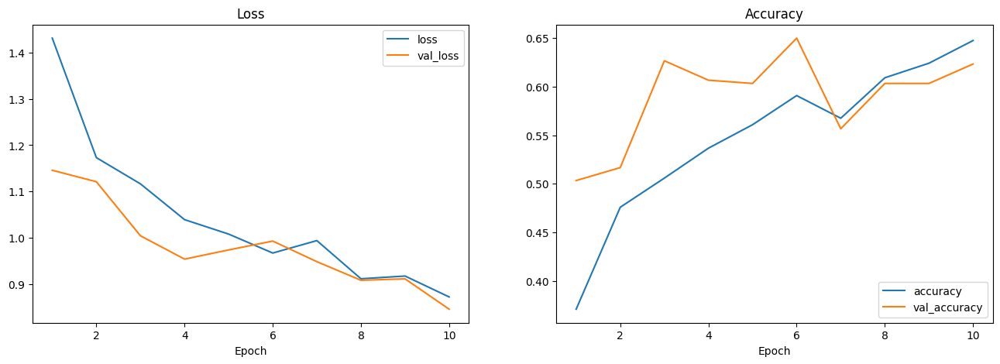

In [75]:
epoch=10

fig, ax = plt.subplots(ncols=2,figsize=(16,5))
ax[0].plot(range(1,epoch+1),history2.history['loss'],label='loss')
ax[0].plot(range(1,epoch+1),history2.history['val_loss'],label='val_loss')
ax[0].set_title('Loss')
ax[0].legend()
ax[0].set_xlabel('Epoch')
#ax[0].set_ylim(0,0.01)

ax[1].plot(range(1,epoch+1),history2.history['accuracy'],label='accuracy')
ax[1].plot(range(1,epoch+1),history2.history['val_accuracy'],label='val_accuracy')
ax[1].set_title('Accuracy')
ax[1].legend()
ax[1].set_xlabel('Epoch')
#ax[1].set_ylim(0.5,1.5)

plt.show()

In [76]:
train_loss1, train_accuracy1 = model_func.evaluate(train3)
val_loss1, val_accuracy1 = model_func.evaluate(val)

print('Training Loss:', train_loss1)
print('Training Accuracy:', train_accuracy1)

print('Validation Loss:', val_loss1)
print('Validation Accuracy:', val_accuracy1)

38/38 ━━━━━━━━━━━━━━━━━━━━ 65s 2s/step - accuracy: 0.6562 - loss: 0.8249
10/10 ━━━━━━━━━━━━━━━━━━━━ 6s 608ms/step - accuracy: 0.6187 - loss: 0.8323
Training Loss: 0.8415217995643616
Training Accuracy: 0.6508333086967468
Validation Loss: 0.845582127571106
Validation Accuracy: 0.6233333349227905


* **Train** 
    * Berdasarkan Hasil eval train, data train memiliki akurasi benar `65.08%` dengan loss sebesar `0.841`. Nilai ini menunjukkan kemampuan prediksi model yang masih kurang baik namun tetap memiliki kemungkinan memprediksi gambar dengan akurat yang lumayan baik jika dibandingkan dengan presentase kesalahannya 
* **Val**
    * Berdasarkan Hasil eval data valuation, data val memiliki akurasi benar `62.3%` dengan loss sebesar `0.845`. Nilai ini menunjukkan kemampuan prediksi model yang masih kurang baik namun tetap memiliki kemungkinan memprediksi gambar dengan akurat yang lumayan baik jika dibandingkan dengan presentase kesalahannya 
* **Kesimplan**
    * Model berupa model overfit, namun overfit ini tidak terlalu besar. 

# **vi. Best Model**

Berikut adalah perbandingan hasil evaluasi model sequential dan model functional :
| CNN Model      | **Sequential** | **Functional** |
|----------------|----------|--------------|
| Accuracy | 0.619    | 0.65        | 
| Val Accuracy |  0.563    | 0.623        |
| Loss | 0.897    | 0.841        |
| Val Loss | 1.023    | 0.845        | 
| Accuracy Difference | 0.056    | 0.027        |

* Berdasarkan hasil evaluasi, model functional memiliki nilai akurasi dan loss serta fitting antara train dan val yang lebih baik ketimbang model sequential. Artinya model functional ini akan digunakan sebagai model terbaik 

## **Tuning Functional API**

Sebelum model ini digunakan, akan dilakukan beberapa penambahan parameter yang diharapkan dapat meningkatkan performa dari model, berikut parameter-parameter yang akan ditambahkan :


* Kernel Initializer: Menggunakan kernel_initializer='he_normal' untuk menginisialisasi bobot dari lapisan-lapisan konvolusi.
* Padding: Menggunakan padding='same' untuk memastikan ukuran output sama dengan ukuran input untuk setiap lapisan konvolusi
* Batch Normalization:  Menambahkan lapisan BatchNormalization setelah setiap lapisan konvolusi.
* Softmax Activation: Digunakan dalam lapisan output untuk klasifikasi multiclass untuk mengubah logit menjadi probabilitas.

Berikut adalah pembuatan modelnya :

In [18]:
# Clear the Keras session
tf.keras.backend.clear_session()

# Define the input layer
input_layer = Input(shape=(400, 400, 3))

# Add the Rescaling layer
rescaled_input = Rescaling(1./255)(input_layer)

# Add the first Conv2D, BatchNormalization, and MaxPooling2D layers
conv1 = Conv2D(32, (3, 3), padding='same', kernel_initializer='he_normal')(rescaled_input)
batch_norm1 = BatchNormalization()(conv1)
leaky_relu1 = LeakyReLU(alpha=0.01)(batch_norm1)
pool1 = MaxPooling2D(2, 2)(leaky_relu1)

# Add the second Conv2D, BatchNormalization, and MaxPooling2D layers
conv2 = Conv2D(64, (3, 3), padding='same', kernel_initializer='he_normal')(pool1)
batch_norm2 = BatchNormalization()(conv2)
leaky_relu2 = LeakyReLU(alpha=0.01)(batch_norm2)
pool2 = MaxPooling2D(2, 2)(leaky_relu2)

# Add the third Conv2D, BatchNormalization, and MaxPooling2D layers
conv3 = Conv2D(128, (3, 3), padding='same', kernel_initializer='he_normal')(pool2)
batch_norm3 = BatchNormalization()(conv3)
leaky_relu3 = LeakyReLU(alpha=0.01)(batch_norm3)
pool3 = MaxPooling2D(2, 2)(leaky_relu3)

# Add the GlobalAveragePooling2D layer
global_avg_pool = GlobalAveragePooling2D()(pool3)

# Add the Dropout layer
dropout = Dropout(0.5)(global_avg_pool)

# Add the first Dense layer
dense1 = Dense(512, kernel_initializer='he_normal')(dropout)
batch_norm4 = BatchNormalization()(dense1)
leaky_relu4 = LeakyReLU(alpha=0.01)(batch_norm4)
dropout2 = Dropout(0.5)(leaky_relu4)

# Add the output Dense layer with softmax activation
output_layer = Dense(5, activation='softmax')(dropout2)

# Create the model
model_func2 = Model(inputs=input_layer, outputs=output_layer)

# Print the model summary
model_func2.summary()

c:\Users\Fadhil\miniconda3\lib\site-packages\keras\src\layers\activations\leaky_relu.py:41: UserWarning: Argument `alpha` is deprecated. Use `negative_slope` instead.
  warnings.warn(


Model: "functional_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)        │ (None, 400, 400, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ rescaling (Rescaling)           │ (None, 400, 400, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d (Conv2D)                 │ (None, 400, 400, 32)   │           896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization             │ (None, 400, 400, 32)   │           128 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu (LeakyReLU)         │ (None, 400, 400, 32)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d (MaxPooling2D)    │ (None, 200, 200, 32)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_1 (Conv2D)               │ (None, 200, 200, 64)   │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_1           │ (None, 200, 200, 64)   │           256 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_1 (LeakyReLU)       │ (None, 200, 200, 64)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_1 (MaxPooling2D)  │ (None, 100, 100, 64)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_2 (Conv2D)               │ (None, 100, 100, 128)  │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_2           │ (None, 100, 100, 128)  │           512 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_2 (LeakyReLU)       │ (None, 100, 100, 128)  │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_2 (MaxPooling2D)  │ (None, 50, 50, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d        │ (None, 128)            │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 512)            │        66,048 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_3           │ (None, 512)            │         2,048 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_3 (LeakyReLU)       │ (None, 512)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_1 (Dropout)             │ (None, 512)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 5)              │         2,565 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 164,805 (643.77 KB)

 Trainable params: 163,333 (638.02 KB)

 Non-trainable params: 1,472 (5.75 KB)

In [19]:
model_func2.compile(loss = 'categorical_crossentropy', optimizer='Adam', metrics=['accuracy'])

Pada model tuning ini, process fitting ditambahkan parameter `callbacks` Parameter ini berfungsi untuk memberhentikan proses epoch pada saat sudah terjadi penambahan val_loss sebanyak 3x

In [20]:
early_stopping_callback = EarlyStopping(
    monitor='val_loss',  # Monitor the validation loss
    patience=3,          # Number of epochs with no improvement after which training will be stopped
    restore_best_weights=True  # Restore model weights from the epoch with the best value of the monitored quantity
)

In [21]:
history3 = model_func2.fit(train3, epochs=10, validation_data=val, callbacks=early_stopping_callback)

Epoch 1/10


c:\Users\Fadhil\miniconda3\lib\site-packages\keras\src\trainers\data_adapters\py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


38/38 ━━━━━━━━━━━━━━━━━━━━ 221s 5s/step - accuracy: 0.4276 - loss: 1.5089 - val_accuracy: 0.3500 - val_loss: 1.8069
Epoch 2/10
38/38 ━━━━━━━━━━━━━━━━━━━━ 231s 6s/step - accuracy: 0.5802 - loss: 1.1220 - val_accuracy: 0.4200 - val_loss: 1.4979
Epoch 3/10
38/38 ━━━━━━━━━━━━━━━━━━━━ 217s 5s/step - accuracy: 0.6251 - loss: 0.9362 - val_accuracy: 0.5300 - val_loss: 1.0809
Epoch 4/10
38/38 ━━━━━━━━━━━━━━━━━━━━ 218s 5s/step - accuracy: 0.6413 - loss: 0.9585 - val_accuracy: 0.5300 - val_loss: 1.0478
Epoch 5/10
38/38 ━━━━━━━━━━━━━━━━━━━━ 225s 5s/step - accuracy: 0.6467 - loss: 0.9206 - val_accuracy: 0.6033 - val_loss: 0.8672
Epoch 6/10
38/38 ━━━━━━━━━━━━━━━━━━━━ 219s 5s/step - accuracy: 0.6396 - loss: 0.9426 - val_accuracy: 0.5867 - val_loss: 0.9302
Epoch 7/10
38/38 ━━━━━━━━━━━━━━━━━━━━ 229s 6s/step - accuracy: 0.6526 - loss: 0.9233 - val_accuracy: 0.5933 - val_loss: 0.9568
Epoch 8/10
38/38 ━━━━━━━━━━━━━━━━━━━━ 210s 5s/step - accuracy: 0.6449 - loss: 0.8858 - val_accuracy: 0.6200 - val_loss: 0.

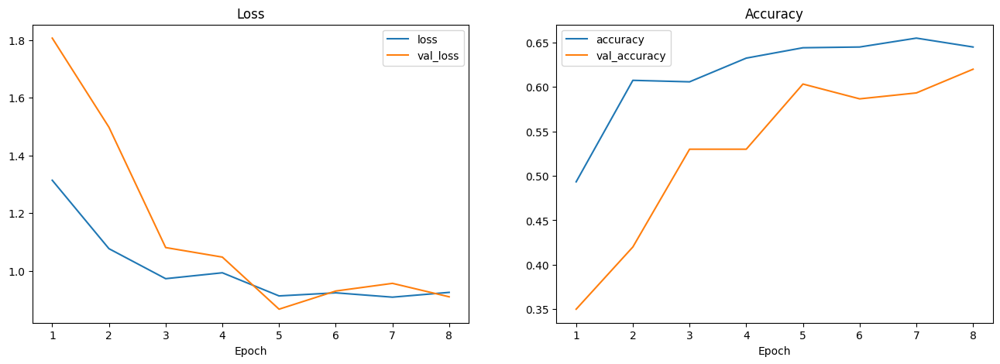

In [24]:
epoch=8

fig, ax = plt.subplots(ncols=2,figsize=(16,5))
ax[0].plot(range(1,epoch+1),history3.history['loss'],label='loss')
ax[0].plot(range(1,epoch+1),history3.history['val_loss'],label='val_loss')
ax[0].set_title('Loss')
ax[0].legend()
ax[0].set_xlabel('Epoch')
#ax[0].set_ylim(0,0.01)

ax[1].plot(range(1,epoch+1),history3.history['accuracy'],label='accuracy')
ax[1].plot(range(1,epoch+1),history3.history['val_accuracy'],label='val_accuracy')
ax[1].set_title('Accuracy')
ax[1].legend()
ax[1].set_xlabel('Epoch')
#ax[1].set_ylim(0.5,1.5)

plt.show()

In [25]:
train_loss2, train_accuracy2 = model_func2.evaluate(train3)
val_loss2, val_accuracy2 = model_func2.evaluate(val)

print('Training Loss:', train_loss2)
print('Training Accuracy:', train_accuracy2)

print('Validation Loss:', val_loss2)
print('Validation Accuracy:', val_accuracy2)

38/38 ━━━━━━━━━━━━━━━━━━━━ 76s 2s/step - accuracy: 0.5751 - loss: 0.9610
10/10 ━━━━━━━━━━━━━━━━━━━━ 11s 1s/step - accuracy: 0.6033 - loss: 0.8664
Training Loss: 0.9819788336753845
Training Accuracy: 0.5699999928474426
Validation Loss: 0.8672158718109131
Validation Accuracy: 0.6033333539962769


* **Train** 
    * Berdasarkan Hasil eval train, data train memiliki akurasi benar `56.9%` dengan loss sebesar `0.981`. Nilai ini menunjukkan kemampuan prediksi model yang masih kurang baik namun tetap memiliki kemungkinan memprediksi gambar dengan akurat yang lumayan baik jika dibandingkan dengan presentase kesalahannya 
* **Val**
    * Berdasarkan Hasil eval data valuation, data val memiliki akurasi benar `60.3%` dengan loss sebesar `0.867`. Nilai ini menunjukkan kemampuan prediksi model yang masih kurang baik namun tetap memiliki kemungkinan memprediksi gambar dengan akurat yang lumayan baik jika dibandingkan dengan presentase kesalahannya 
* **Kesimplan**
    * Model memiliki fitting yang baik dimana val test memiliki akurasi lebih besar dari train set dengan perbedaan yang masih masuk akal

## **Kesimpulan Best Model** 

Berikut perbandadingan nilai evaluasi functional API dan functional API Tuning :

| CNN Model      | **Functional Tuning** | **Functional** |
|----------------|----------|--------------|
| Accuracy | 0.569    | 0.65        | 
| Val Accuracy |  0.603    | 0.623        |
| Loss | 0.981    | 0.841        |
| Val Loss | 0.867    | 0.845        | 
| Accuracy Difference | 0.134    | 0.027        |

* berdasarkan hasil perbandingan, nilai akurasi train dan val dari model functional lebih baik ketimbang model functional Tuning. Fitting dari train dan val functional juga lebih baik dibandingkan functional tuning. Berdasarkan nilai tersebut dapat disimpulkan bahwa model terbaik tetaplah model Functional API tanpa tuning

# **vii. Model Saving**

In [19]:
#save model
model_func.save('model_func.keras') 


# **viii. Model Inference** 

* Proses dikerjakan pada file inference

# **ix. Conclusion**

## **EDA**

* Terdapat 5 kelas pada dataset, yaitu `foggy`, `rain`, `cloudy`, `sunrise`, `sunshine`
* Data dari data memiliki persebaran imbalance, tapi karena inbalance tersebut masih bernilai kecil, balancing tidak perlu dilakukan
* Data yang masuk masih memiliki bentuk normal, untuk meningkatkan akurasi model, augmentasi perlu dilakukan

## **Model**

* Berdasarkan hasil evaluasi antara model sequential dan functional, model functional adalah model yang lebih baik dengan besar accuracy `62.3%` dengan loss sebesar `0.981`. Functional ini akan digunakan sebagai model final, tetapi sebelum itu akan dilakukan tuning dengan harapan dapat meningkatkan performa dari model
* Berdasarkan hasil evaluasi model tuning dan tanpa tuning, didapatkan besar accuracy dari model tuning adalah `60.2%` yang malah memiliki nilai akurasi lebih rendah dibandingkan accuracy model normal yaitu `62.3%`.
* berdasarkan hasil perbandingan, nilai akurasi train dan val dari model functional lebih baik ketimbang model functional Tuning. Fitting dari train dan val functional juga lebih baik dibandingkan functional tuning. Dari nilai tersebut dapat disimpulkan bahwa model terbaik tetaplah model Functional API tanpa tuning, sehingga model inilah yang digunakan sebagai model final
* Dari pengujian menggunakan data random pada inference dari 3 gambar random, 1 mendapatkan hasil prediksi yang salah, ini diketahui terjadi karena nilai accuracy dari model yang hanya memiliki kisaran 60%, dimana terdapat persentase kesalahan sebesar 40%
* Secara keseluruhan model dapat digunakan untuk memprediksi data random 

# **X. Recommendation**

## **Model** 

Berdasarkan hasil kinerja dari model, berikut saran yang dapat diberikan :
* Pengembangan Dataset: Melakukan ekspansi pada dataset dengan menggabungkan lebih banyak data atau variasi yang lebih luas dapat membantu meningkatkan kemampuan model dalam mengenali pola yang kompleks.
* Optimalisasi Hyperparameter: Penambahan parameter dengan nilai yang sesuai terhadap hyperparameter seperti learning rate, batch size, jumlah epoch, dan pengaturan lainnya dapat membantu menemukan konfigurasi yang lebih optimal bagi model.
* Ekstraksi Fitur: Menerapkan teknik ekstraksi fitur atau transfer learning dari model yang telah dilatih dengan dataset yang lebih besar dan beragam dapat memberikan hasil yang lebih baik dalam klasifikasi.
* Augmentasi Data: Menggunakan teknik augmentasi data seperti rotasi, pergeseran, atau pembalikan gambar pada dataset pelatihan dapat membantu model dalam memperoleh pemahaman yang lebih baik tentang variasi data.
* Ensemble Learning: Menggabungkan beberapa model menggunakan teknik ensemble learning dapat menghasilkan prediksi yang lebih akurat dengan mengkompensasi kelemahan individual dari setiap model.

## **Bisnis**

Berikut rekomendasi bisnis yang dapat dilakukan menggunakan model prediksi cuaca ini :
* Mengintegrasikan model klasifikasi cuaca ke dalam aplikasi cuaca yang ada atau buat aplikasi baru yang memungkinkan pengguna untuk mengambil gambar langit atau kondisi cuaca dan mendapatkan prediksi tentang jenis cuaca yang mungkin terjadi.
Penggunaan dalam Peralatan Pertanian:
* Memanfaatkan model untuk membantu petani dalam merencanakan aktivitas pertanian berdasarkan prediksi cuaca. Misalnya, jika model memprediksi hujan, petani dapat mempersiapkan irigasi tambahan atau mengatur jadwal penanaman yang tepat.
* Membuat aplikasi atau situs web yang memungkinkan pengguna mencari tahu cuaca di lokasi wisata tertentu berdasarkan gambar yang diunggah. Ini bisa membantu wisatawan merencanakan perjalanan mereka dengan lebih baik.